In [1]:
import hdbscan
import pickle
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, ImageOps
import seaborn as sns
from clustering_hyperparams import get_hyperparameters

In [2]:
with open('bsc-3m/traj_01_elab.pkl', 'rb') as f:
    df = pickle.load(f)
df = df.loc[df['class'] == 'Car']
x = df[['x0', 'y0', 'x1', 'y1']].to_numpy()

In [3]:
min_cluster_size, min_samples, cluster_selection_epsilon = get_hyperparameters('Car', '')
clusterer = hdbscan.HDBSCAN(
    min_cluster_size=min_cluster_size,
    min_samples=min_samples,
    cluster_selection_epsilon=cluster_selection_epsilon
)
xc = np.array(clusterer.fit_predict(x))
df['cluster'] = xc

plotting all clusters
plotting cluster -1
plotting cluster 0
plotting cluster 1
plotting cluster 2
plotting cluster 3
plotting cluster 4
plotting cluster 5
plotting cluster 6
plotting cluster 7
plotting cluster 8
plotting cluster 9
plotting cluster 10
plotting cluster 11


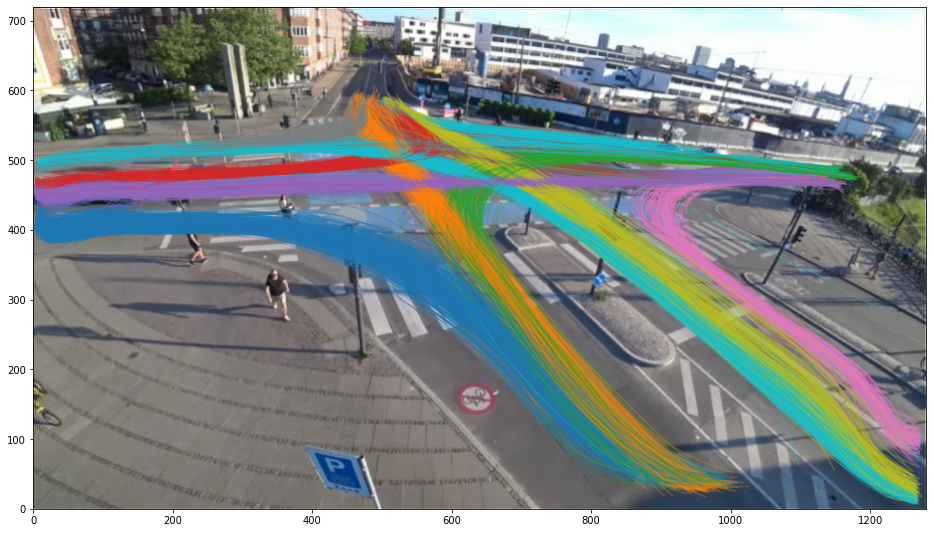

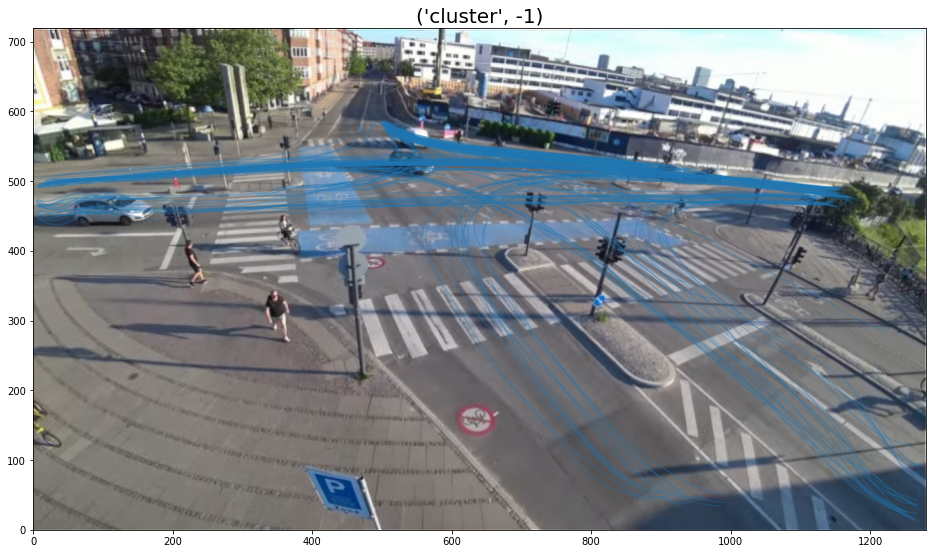

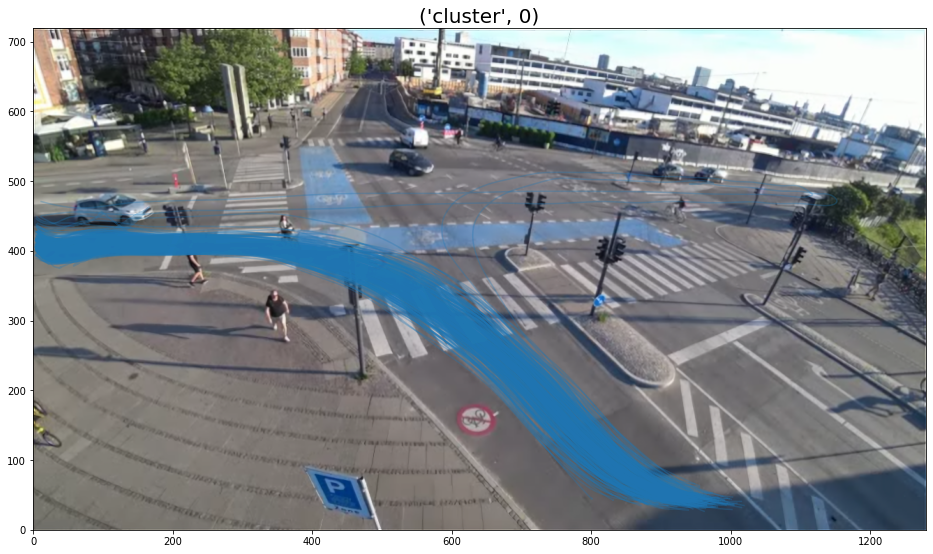

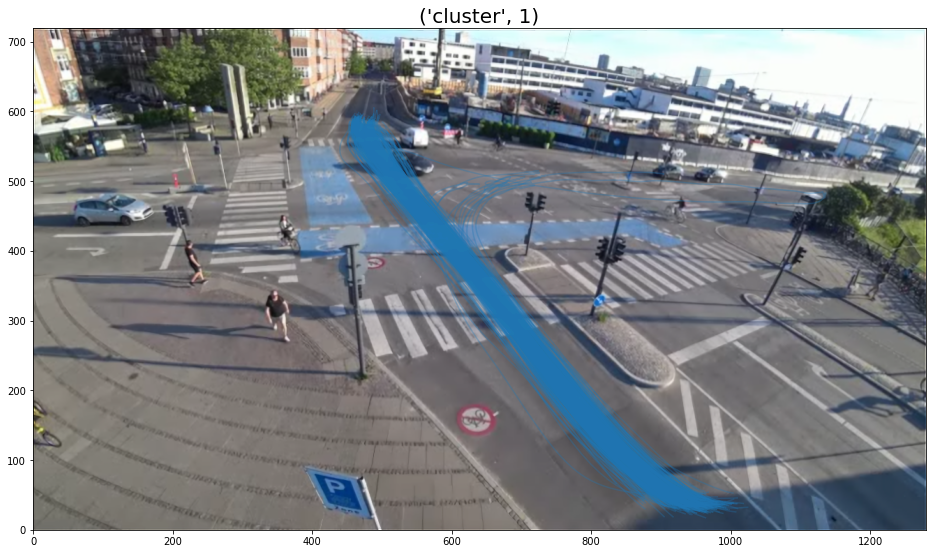

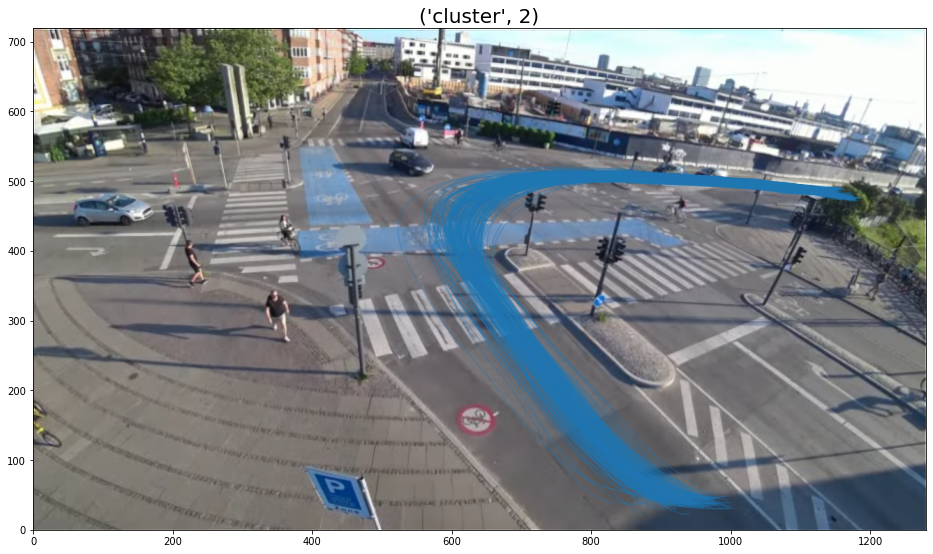

...

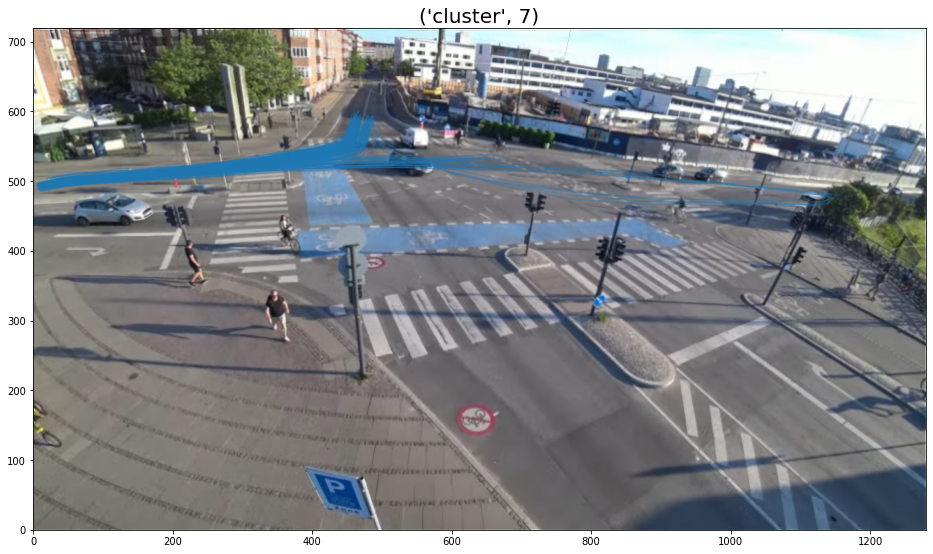

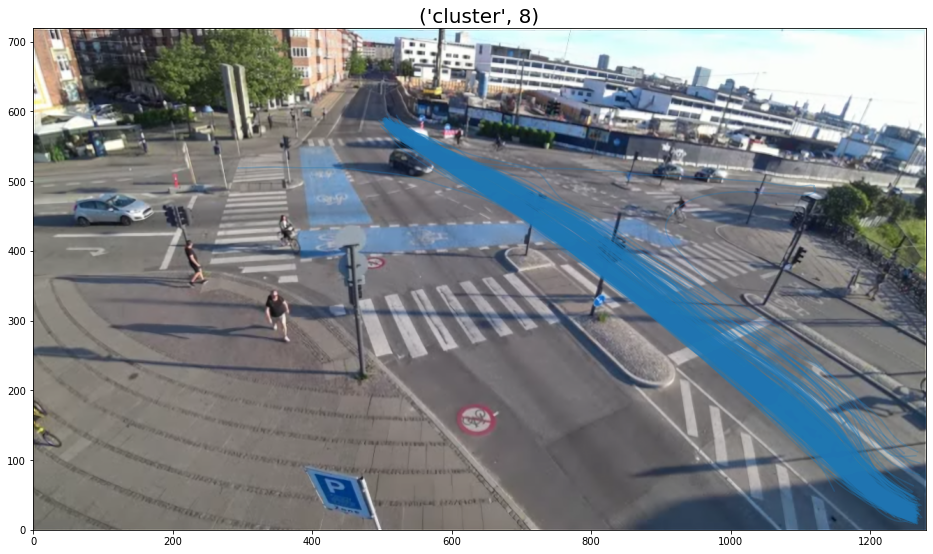

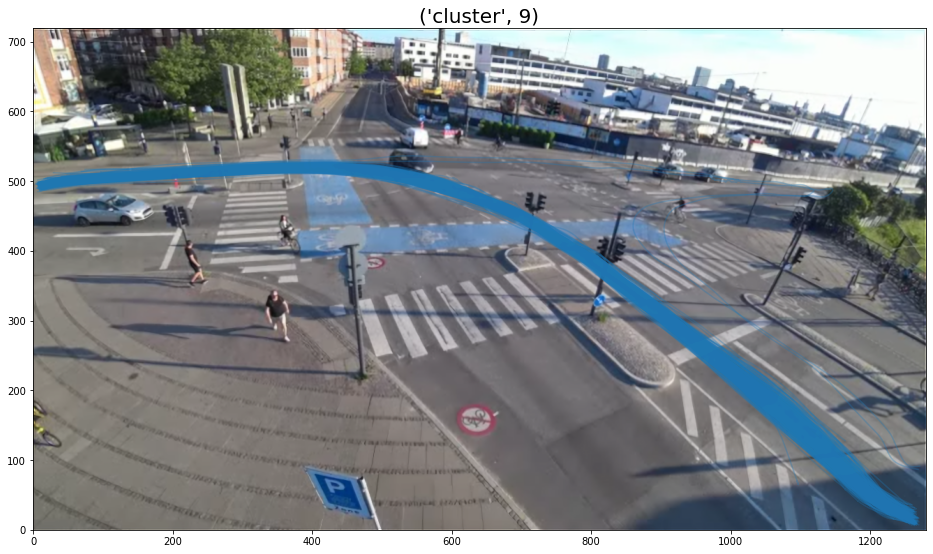

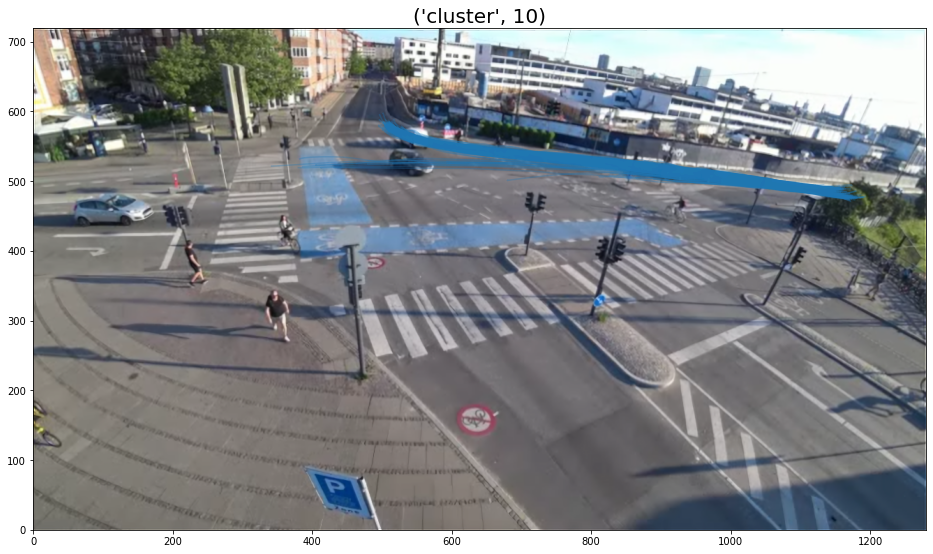

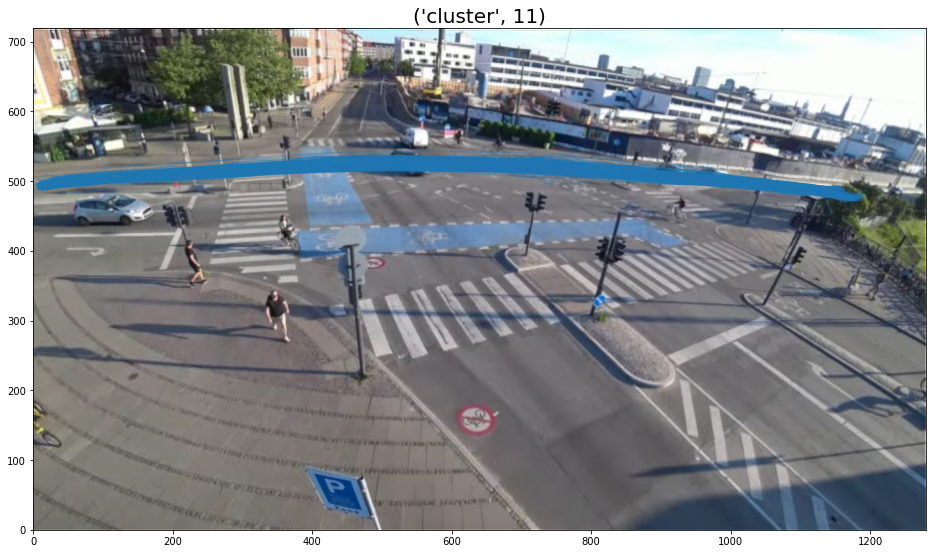

In [26]:
# MAKING ALL CLUSTER INCLUDING OUTLIERS!
col = sns.color_palette()
print('plotting all clusters')
fig, ax = plt.subplots(figsize=(16, 16))
im = Image.open("intersection2.png")
im = ImageOps.flip(im)
ax.set_xlim(0, 1280)
ax.set_ylim(0, 720)
ax.imshow(im, origin='lower')
for _, row in df.iterrows():
    try:
        ax.plot(row['xs'], row['ys'], color=col[row['cluster']], alpha=0.3)
    except IndexError:
        continue
plt.savefig('figs/all_clusters.svg', dpi=150)

for cluster in np.unique(df['cluster']):
    fig, ax = plt.subplots(figsize=(16, 16))
    im = Image.open("intersection2.png")
    im = ImageOps.flip(im)
    ax.set_xlim(0, 1280)
    ax.set_ylim(0, 720)
    ax.imshow(im, origin='lower')
    print('plotting cluster', cluster)
    df_c = df.loc[df['cluster'] == cluster]
    for _, row in df_c.iterrows():
        ax.plot(row['xs'], row['ys'], color=col[0], alpha=0.3)
        ax.set_title(label = ("cluster",cluster), fontsize=20)

In [30]:
#Locating all outliers.
threshold = pd.Series(clusterer.outlier_scores_).quantile(0.97) #threshold for cutoff. 
outliers = np.where(clusterer.outlier_scores_ > threshold)[0]
df["outliers"] = clusterer.outlier_scores_
df_o = df[df["outliers"] > threshold]

Plotting outliers in their respective cluster
plotting cluster 1
plotting cluster 3
plotting cluster 4
plotting cluster 8
plotting cluster 9
plotting cluster 11


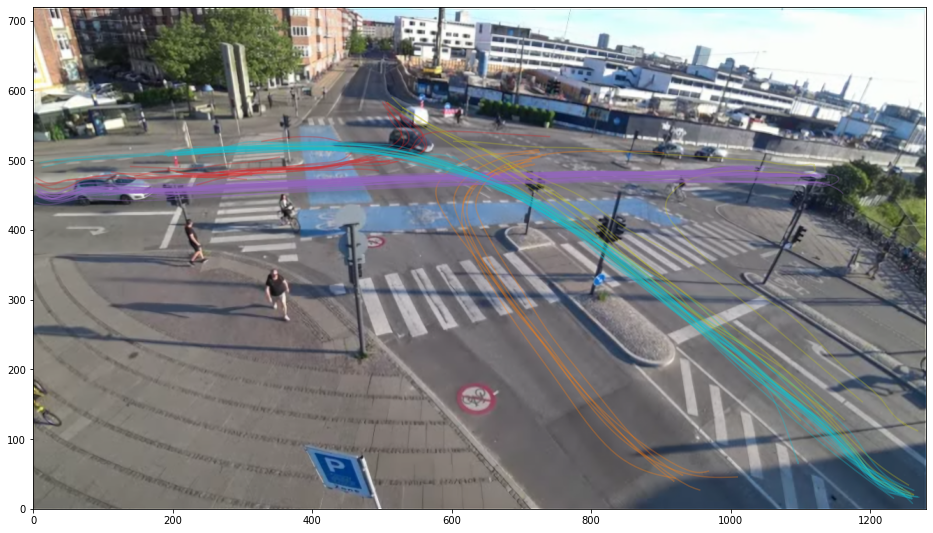

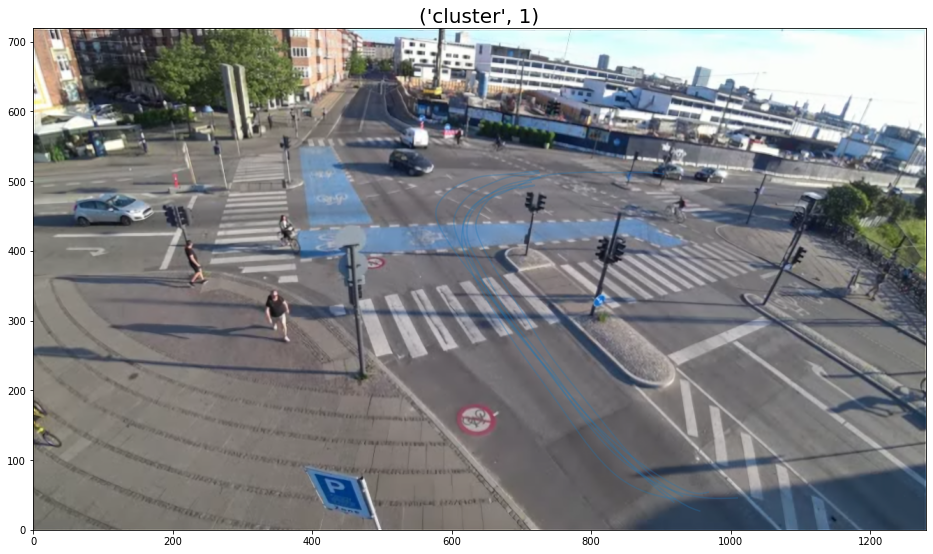

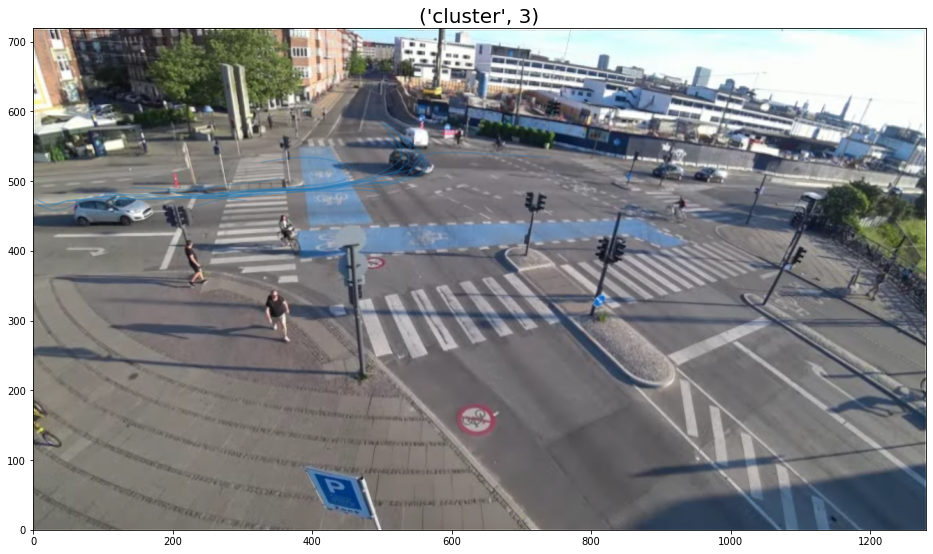

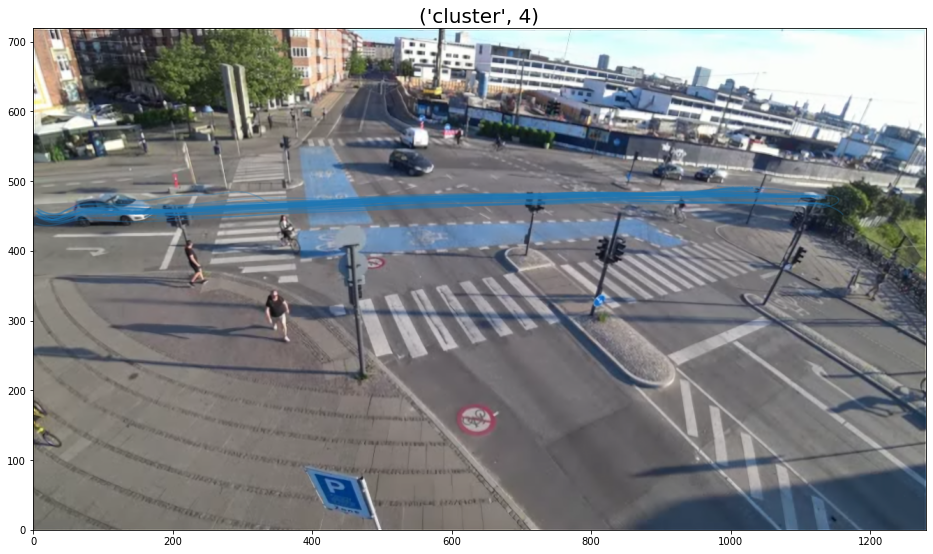

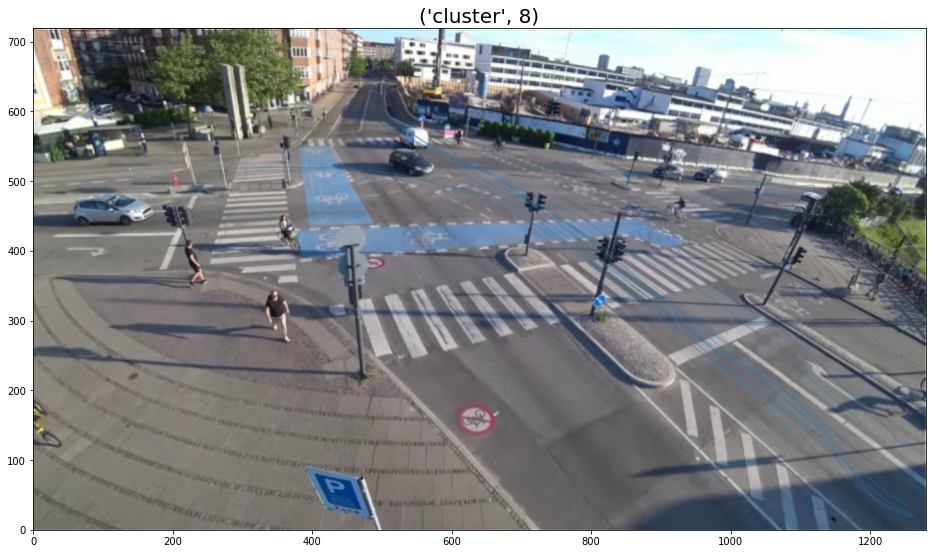

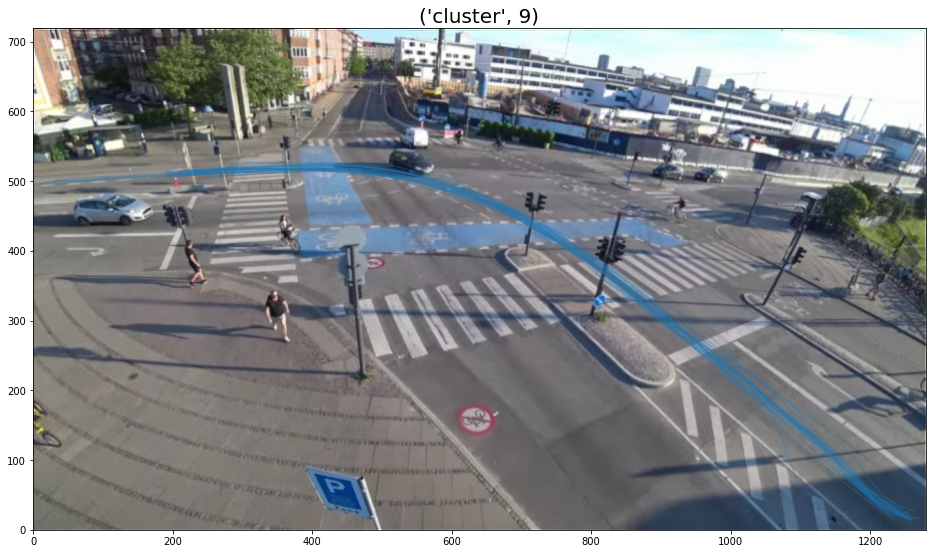

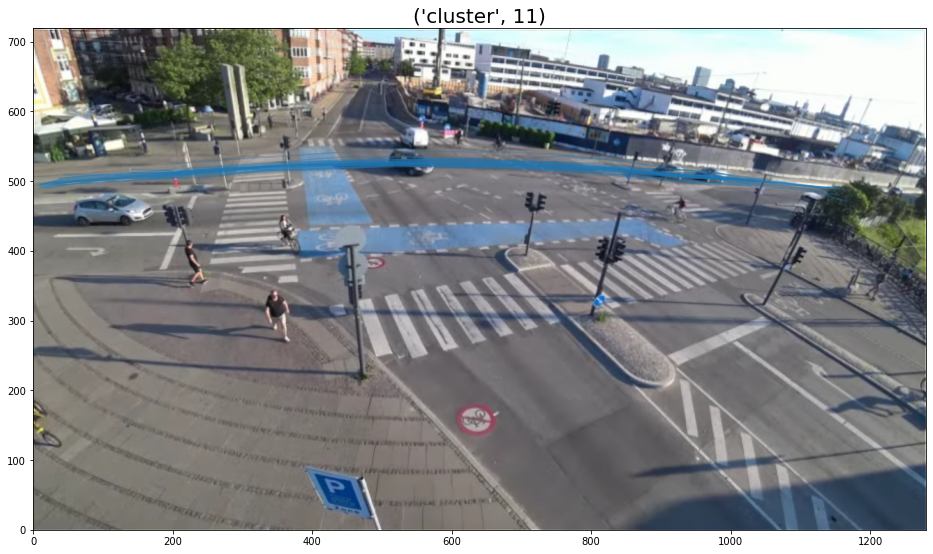

In [31]:
# PLOTTING THE OUTLIERS
col = sns.color_palette()
print('Plotting outliers in their respective cluster')
fig, ax = plt.subplots(figsize=(16, 16))
im = Image.open("intersection2.png")
im = ImageOps.flip(im)
ax.set_xlim(0, 1280)
ax.set_ylim(0, 720)
ax.imshow(im, origin='lower')
for _, row in df_o.iterrows():
    try:
        ax.plot(row['xs'], row['ys'], color=col[row['cluster']], alpha=0.3)
    except IndexError:
        continue
#plt.savefig('figs/all_clusters.svg', dpi=150)

for cluster in np.unique(df_o['cluster']):
    fig, ax = plt.subplots(figsize=(16, 16))
    im = Image.open("intersection2.png")
    im = ImageOps.flip(im)
    ax.set_xlim(0, 1280)
    ax.set_ylim(0, 720)
    ax.imshow(im, origin='lower')
    print('plotting cluster', cluster)
    df_c = df_o.loc[df_o['cluster'] == cluster]
    for _, row in df_c.iterrows():
        ax.set_title(label = ("cluster",cluster), fontsize=20)
        ax.plot(row['xs'], row['ys'], color=col[0], alpha=0.3)